In [46]:
import pandas as pd 
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import calmap
from ydata_profiling import ProfileReport

In [84]:
df = pd.read_csv('supermarket_sales.csv')


df['Date'] = pd.to_datetime(df['Date']) 
df.set_index('Date', inplace=True)
df.head(10)


,Invoice ID,Branch,City,Customer type,Gender,Product line,Unit price,Quantity,Tax 5%,Total,Time,Payment,cogs,gross margin percentage,gross income,Rating
Date,,,,,,,,,,,,,,,,
2019-01-05,750-67-8428,A,Yangon,Member,Female,Health and beauty,74.69,7,26.1415,548.9715,13:08,Ewallet,522.83,4.761905,26.1415,9.1
2019-03-08,226-31-3081,C,Naypyitaw,Normal,Female,Electronic accessories,15.28,5,3.8200,80.2200,10:29,Cash,76.40,4.761905,3.8200,9.6
2019-03-03,631-41-3108,A,Yangon,Normal,Male,Home and lifestyle,46.33,7,16.2155,340.5255,13:23,Credit card,324.31,4.761905,16.2155,7.4
2019-01-27,123-19-1176,A,Yangon,Member,Male,Health and beauty,58.22,8,23.2880,489.0480,20:33,Ewallet,465.76,4.761905,23.2880,8.4
2019-02-08,373-73-7910,A,Yangon,Normal,Male,Sports and travel,86.31,7,30.2085,634.3785,10:37,Ewallet,604.17,4.761905,30.2085,5.3
2019-03-25,699-14-3026,C,Naypyitaw,Normal,Male,Electronic accessories,85.39,7,29.8865,627.6165,18:30,Ewallet,597.73,4.761905,29.8865,4.1
2019-02-25,355-53-5943,A,Yangon,Member,Female,Electronic accessories,68.84,6,20.6520,433.6920,14:36,Ewallet,413.04,4.761905,20.6520,5.8
2019-02-24,315-22-5665,C,Naypyitaw,Normal,Female,Home and lifestyle,73.56,10,36.7800,772.3800,11:38,Ewallet,735.60,4.761905,36.7800,8.0
2019-01-10,665-32-9167,A,Yangon,Member,Female,Health and beauty,36.26,2,3.6260,76.1460,17:15,Credit card,72.52,4.761905,3.6260,7.2


Univariate Analysis

Let us see the distribution of the ratings

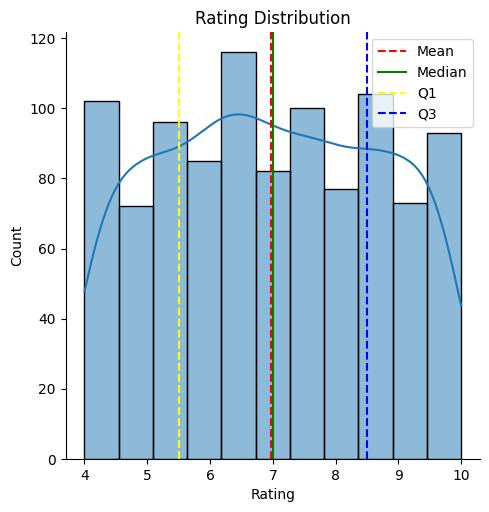

In [48]:
sns.displot(df["Rating"], kde=True)
plt.title("Rating Distribution")
plt.axvline(df["Rating"].mean(), color="red", label="Mean", ls="--")
plt.axvline(df["Rating"].median(), color="green", label="Median")
plt.axvline(x=np.percentile(df["Rating"], 25), color="yellow", label="Q1",ls = "--")
plt.axvline(x=np.percentile(df["Rating"], 75), color="blue", label="Q3", ls = "--")
plt.legend()

array([[<Axes: title={'center': 'Unit price'}>,
        <Axes: title={'center': 'Quantity'}>,
        <Axes: title={'center': 'Tax 5%'}>],
       [<Axes: title={'center': 'Total'}>,
        <Axes: title={'center': 'cogs'}>,
        <Axes: title={'center': 'gross margin percentage'}>],
       [<Axes: title={'center': 'gross income'}>,
        <Axes: title={'center': 'Rating'}>, <Axes: >]], dtype=object)

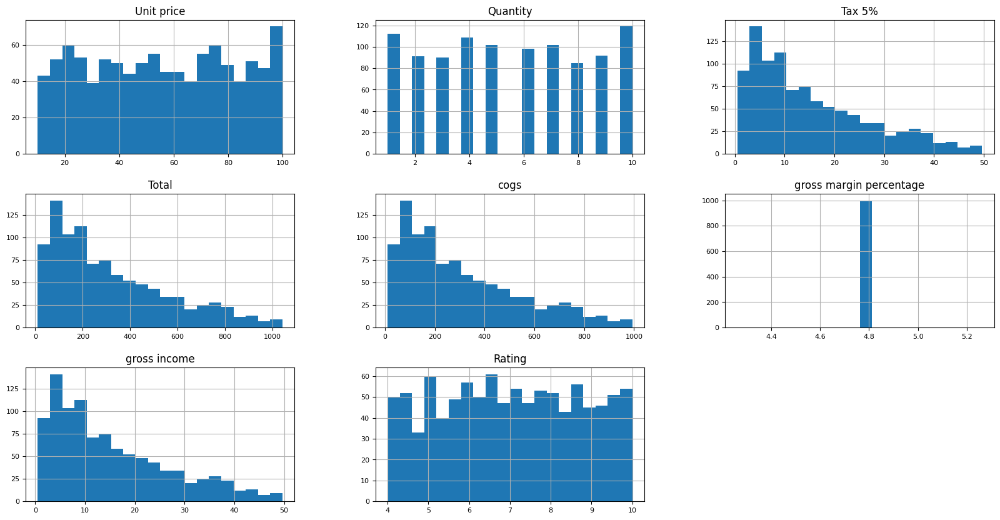

In [49]:
df.hist(figsize=(20, 10), bins=20, xlabelsize=8, ylabelsize=8)

So by looking at the distributions of the variables, we can conclude that the tax, total, gross income and cogs are mostly right skewed. We can also say that Total,tax,cogs and gross income are highly correlated as they have the same shape.


So next we can also see how much the sales differ from each branch

<Axes: xlabel='count', ylabel='Branch'>

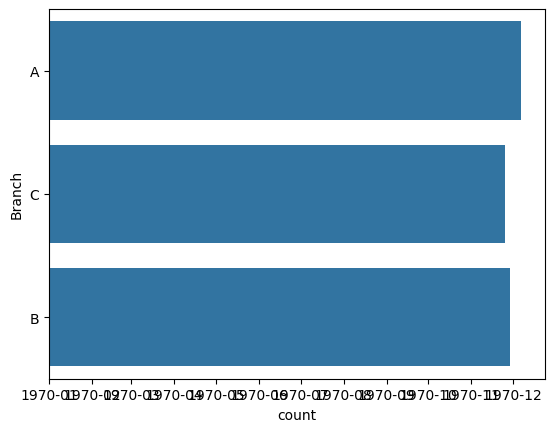

In [50]:
sns.countplot(df['Branch'])


<Axes: xlabel='count', ylabel='Payment'>

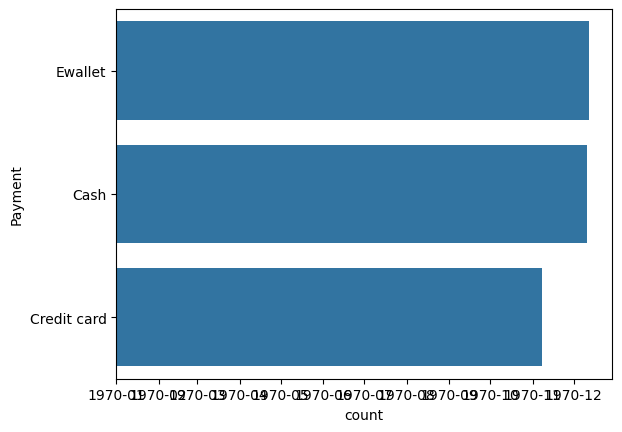

In [51]:
sns.countplot(df['Payment'])

So now that we have analysed most of the variables on its own, we can start to look for relationships between the variables

So beforehand we have found out that there is a high correlation between 4 variables, however we want to investigate whether there is a relationship between customer ratings and how much they spend

<Axes: xlabel='Rating', ylabel='gross income'>

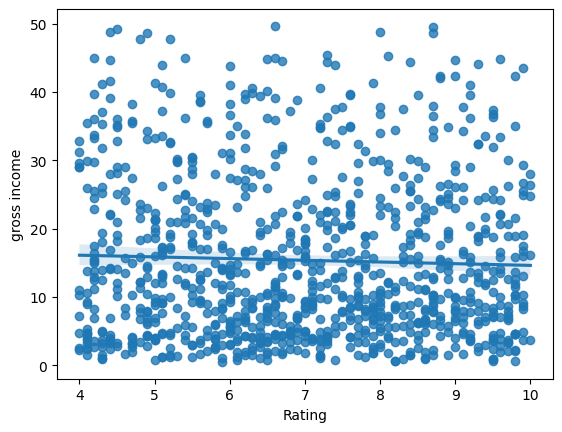

In [52]:
sns.regplot(x='Rating', y='gross income', data=df)  

So looking at the plot, the regression is pretty flat, so therefore we can conclude that there is no relationship between customer's spendings and ratings

So next, we can explore whether there is a relationship between gender and how much they spend

<Axes: xlabel='Gender', ylabel='gross income'>

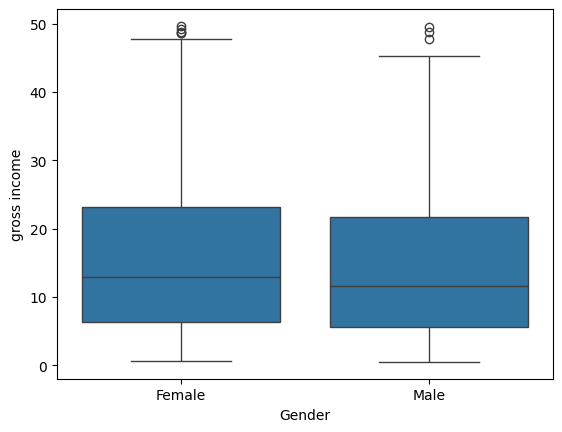

In [53]:
sns.boxplot(x = df['Gender'], y = df['gross income'])

Looking at this boxplot, we can see that both genders generally spend the same amount of money in the supermarkets, so therefore there is no relationship between gender and customer spending

Next we can investigate whether there is a time trend in the income made by the various supermarkets

In [64]:
df.head()

,Invoice ID,Branch,City,Customer type,Gender,Product line,Unit price,Quantity,Tax 5%,Total,Time,Payment,cogs,gross margin percentage,gross income,Rating
Date,,,,,,,,,,,,,,,,
2019-01-05,750-67-8428,A,Yangon,Member,Female,Health and beauty,74.69,7,26.1415,548.9715,13:08,Ewallet,522.83,4.761905,26.1415,9.1
2019-03-08,226-31-3081,C,Naypyitaw,Normal,Female,Electronic accessories,15.28,5,3.8200,80.2200,10:29,Cash,76.40,4.761905,3.8200,9.6
2019-03-03,631-41-3108,A,Yangon,Normal,Male,Home and lifestyle,46.33,7,16.2155,340.5255,13:23,Credit card,324.31,4.761905,16.2155,7.4
2019-01-27,123-19-1176,A,Yangon,Member,Male,Health and beauty,58.22,8,23.2880,489.0480,20:33,Ewallet,465.76,4.761905,23.2880,8.4
2019-02-08,373-73-7910,A,Yangon,Normal,Male,Sports and travel,86.31,7,30.2085,634.3785,10:37,Ewallet,604.17,4.761905,30.2085,5.3


In [65]:
#group all the data by the date and calculate the mean of the numerical columns
numeric_df = df.select_dtypes(include=[np.number])
result = numeric_df.groupby(numeric_df.index.date).mean()   
result.head()

,Unit price,Quantity,Tax 5%,Total,cogs,gross margin percentage,gross income,Rating
2019-01-01,54.995833,6.750000,18.830083,395.431750,376.601667,4.761905,18.830083,6.583333
2019-01-02,44.635000,6.000000,11.580375,243.187875,231.607500,4.761905,11.580375,6.050000
2019-01-03,59.457500,4.625000,12.369813,259.766062,247.396250,4.761905,12.369813,8.112500
2019-01-04,51.743333,5.333333,12.886417,270.614750,257.728333,4.761905,12.886417,6.516667
2019-01-05,61.636667,4.583333,14.034458,294.723625,280.689167,4.761905,14.034458,7.433333


<Axes: xlabel='None', ylabel='gross income'>

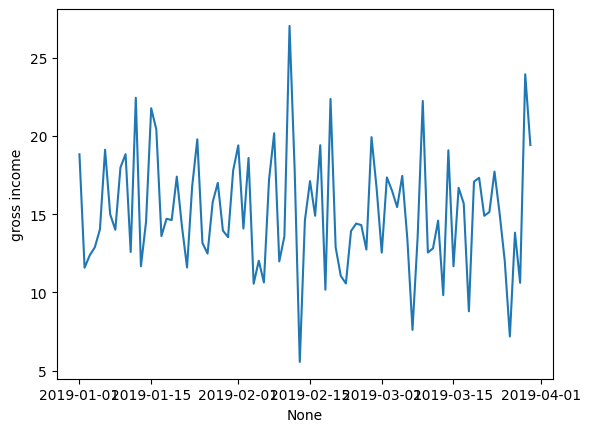

In [67]:
sns.lineplot(x=result.index, y=result['gross income']) 

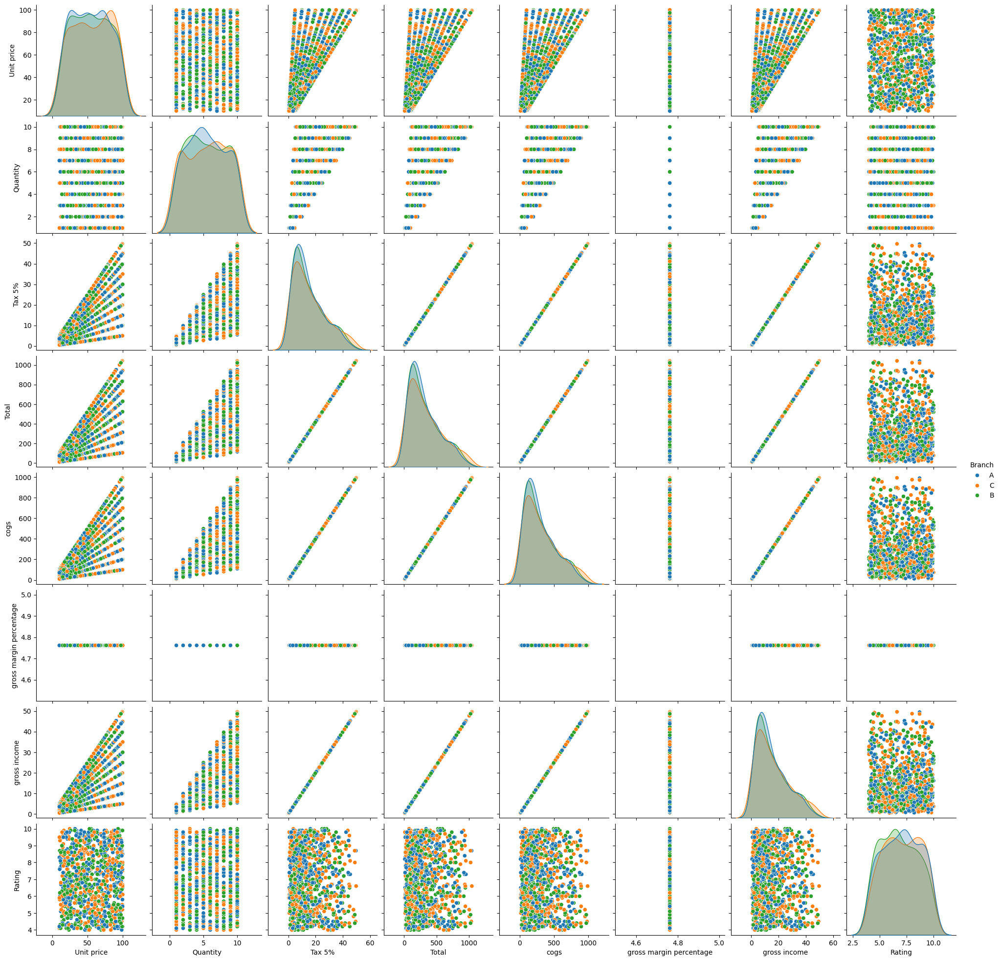

In [68]:
sns.pairplot(df, hue='Branch')

Using this knowledge, we can actually use a profiler to generate a report

In [74]:
dataset = pd.read_csv('supermarket_sales.csv')
report = ProfileReport(dataset)
report

Render HTML: 100%|██████████| 1/1 [00:02<00:00,  2.69s/it]


Next we can do some correlationa analysis between some variables

In [77]:
np.corrcoef(df["Rating"], df["gross income"])[1][0]

-0.03644170499701838

In [81]:
np.round(result.corr(),2)   

,Unit price,Quantity,Tax 5%,Total,cogs,gross margin percentage,gross income,Rating
Unit price,1.00,0.01,0.61,0.61,0.61,NaN,0.61,0.04
Quantity,0.01,1.00,0.73,0.73,0.73,NaN,0.73,-0.10
Tax 5%,0.61,0.73,1.00,1.00,1.00,NaN,1.00,-0.05
Total,0.61,0.73,1.00,1.00,1.00,NaN,1.00,-0.05
cogs,0.61,0.73,1.00,1.00,1.00,NaN,1.00,-0.05
gross margin percentage,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
gross income,0.61,0.73,1.00,1.00,1.00,NaN,1.00,-0.05
Rating,0.04,-0.10,-0.05,-0.05,-0.05,NaN,-0.05,1.00


<Axes: >

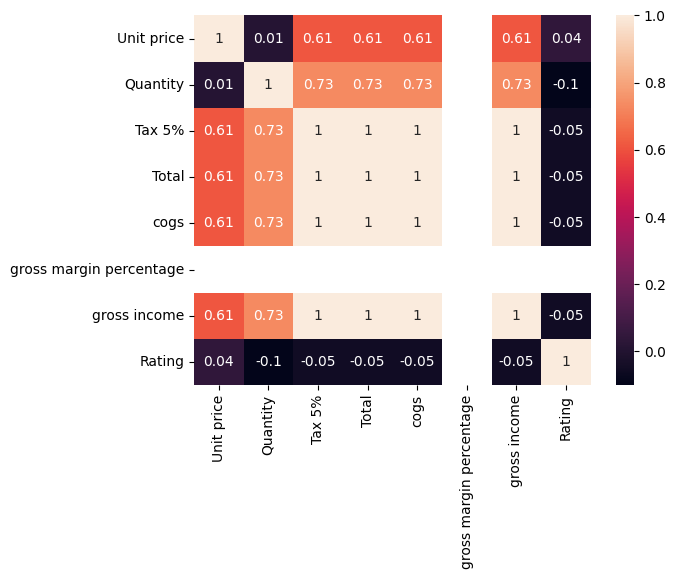

In [83]:
sns.heatmap(np.round(result.corr(),2), annot=True)